In [53]:
#download data 
import os
import zipfile
from urllib.request import urlretrieve
url = "https://www.dropbox.com/s/0pigmmmynbf9xwq/dataset1.zip"
file_path = "dataset1.zip"
urlretrieve(url , file_path)

('dataset1.zip', <http.client.HTTPMessage at 0x2689a3f5100>)

In [54]:
import tarfile
import gzip

In [ ]:
#os.mkdir("./semantic_segmentation_dataset")
with zipfile.ZipFile("dataset1.zip") as f:
    f.extractall("./semantic_segmentation_dataset/")

In [ ]:
os.listdir("./semantic_segmentation_dataset/dataset1")

['annotations_prepped_test',
 'annotations_prepped_train',
 'images_prepped_test',
 'images_prepped_train']

In [129]:
######### build data pipeline and model for training ######
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import torch
from torch import nn
from torch.utils.data import DataLoader , Dataset
import torchvision
from sklearn.model_selection import train_test_split
import os , glob
import tqdm
from tqdm import notebook

In [130]:
########## build data pipeline and build model ##################3
tfm_train_img = torchvision.transforms.Compose([

    torchvision.transforms.RandomRotation((-20, 20)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomVerticalFlip(),
    torchvision.transforms.RandomCrop(size = (200, 200)),
    torchvision.transforms.Resize((224, 224),antialias=False),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std = [0.229, 0.224, 0.225])
])
tfm_train_mask = torchvision.transforms.Compose([

    torchvision.transforms.RandomRotation((-20, 20)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomVerticalFlip(),
    torchvision.transforms.RandomCrop(size = (200, 200)),
    torchvision.transforms.Resize((224, 224),antialias=False),
])
########## build data pipeline and build model ##################3
tfm_valid = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224),antialias=False),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std = [0.229, 0.224, 0.225])
])


In [131]:
from typing import Tuple

In [132]:
class SegData(Dataset):
    def __init__(self, split, tfms=None, type='train') -> None:
        self.split = split
        self.images = glob.glob(f"semantic_segmentation_dataset/dataset1/images_prepped_{self.split}/*.png")
        self.masks = glob.glob(f"semantic_segmentation_dataset/dataset1/annotations_prepped_{self.split}/*.png")
        self.tfms = tfms
        self.type =type
    def __len__(self) ->int :
        return self.images.__len__()
    def __getitem__(self, index) -> Tuple[torch.FloatTensor , torch.LongTensor]:
        image = self.images[index]
        image = cv2.imread(image, cv2.COLOR_BGR2RGB)/255.0
        image = torch.FloatTensor(image).permute(2, 0, 1)
        mask = self.masks[index]
        mask = cv2.imread(mask, cv2.COLOR_BGR2RGB)
        if self.type!="train":
            mask = cv2.resize(mask, (224,224))
        mask = torch.FloatTensor(mask)
        if self.tfms:
            if self.type == 'train':
                img_tfms = self.tfms[0]
                mask_tfms = self.tfms[1]
                state = torch.get_rng_state() #to ensure that it apply on both image and mask with same random values ij transformers
                image = img_tfms(image)
                torch.set_rng_state(state)
                mask = mask_tfms(mask.unsqueeze(0).repeat_interleave(3,0)).mean(dim=0)
            else:
                image = self.tfms(image)
        return image , mask.long()
    

In [133]:
trn_ds = SegData("train")
val_ds = SegData("test")

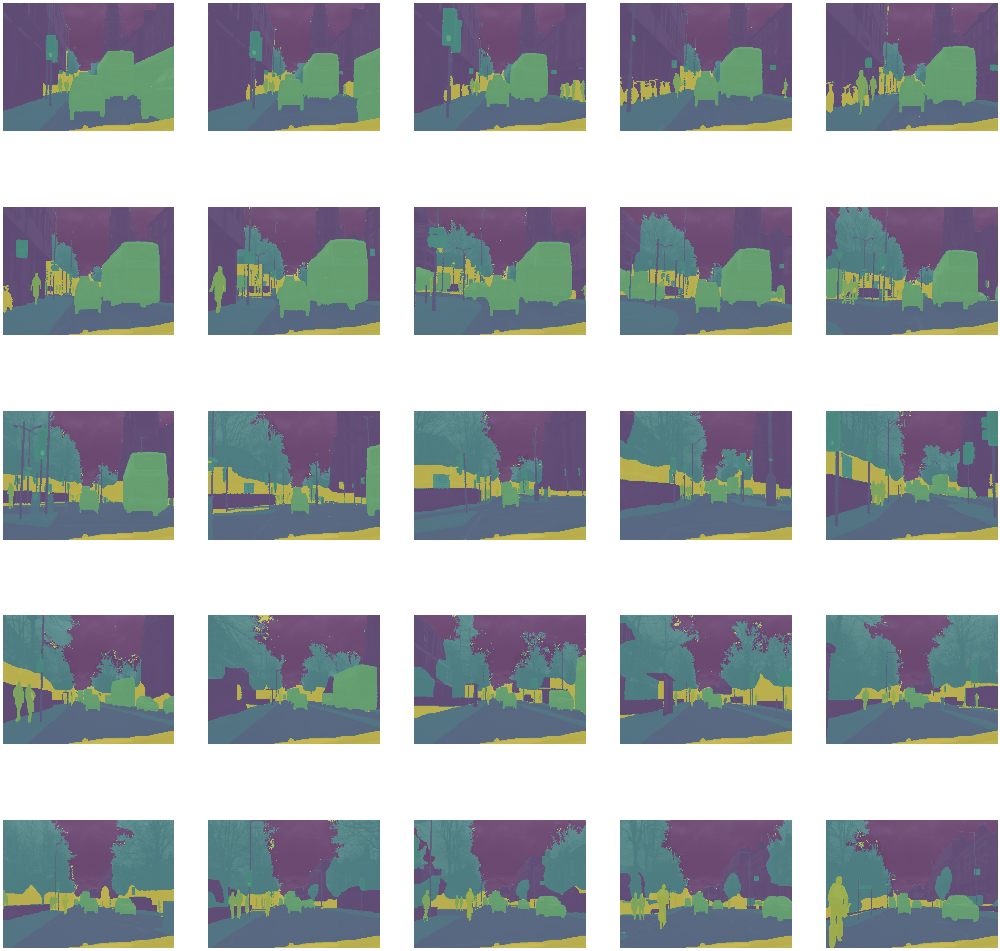

In [134]:
fig, axes = plt.subplots(5 , 5, figsize=(50 , 50))
axes = axes.flatten()
for i, ax in enumerate(axes):
    img, mask = trn_ds[i]
    img = img.permute(1,2,0).numpy()*0.224+0.456
    mask = mask.numpy()
    ax.imshow(img)
    ax.imshow(mask , alpha = 0.5)
    ax.axis("off")

In [135]:
mask.shape

(360, 480)

In [136]:
np.unique(mask)

array([ 0,  1,  2,  3,  4,  5,  6,  8,  9, 10, 11], dtype=int64)

In [137]:
trn_ds = SegData("train", [tfm_train_img, tfm_train_mask])
val_ds = SegData("test",tfm_valid, type='valid')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

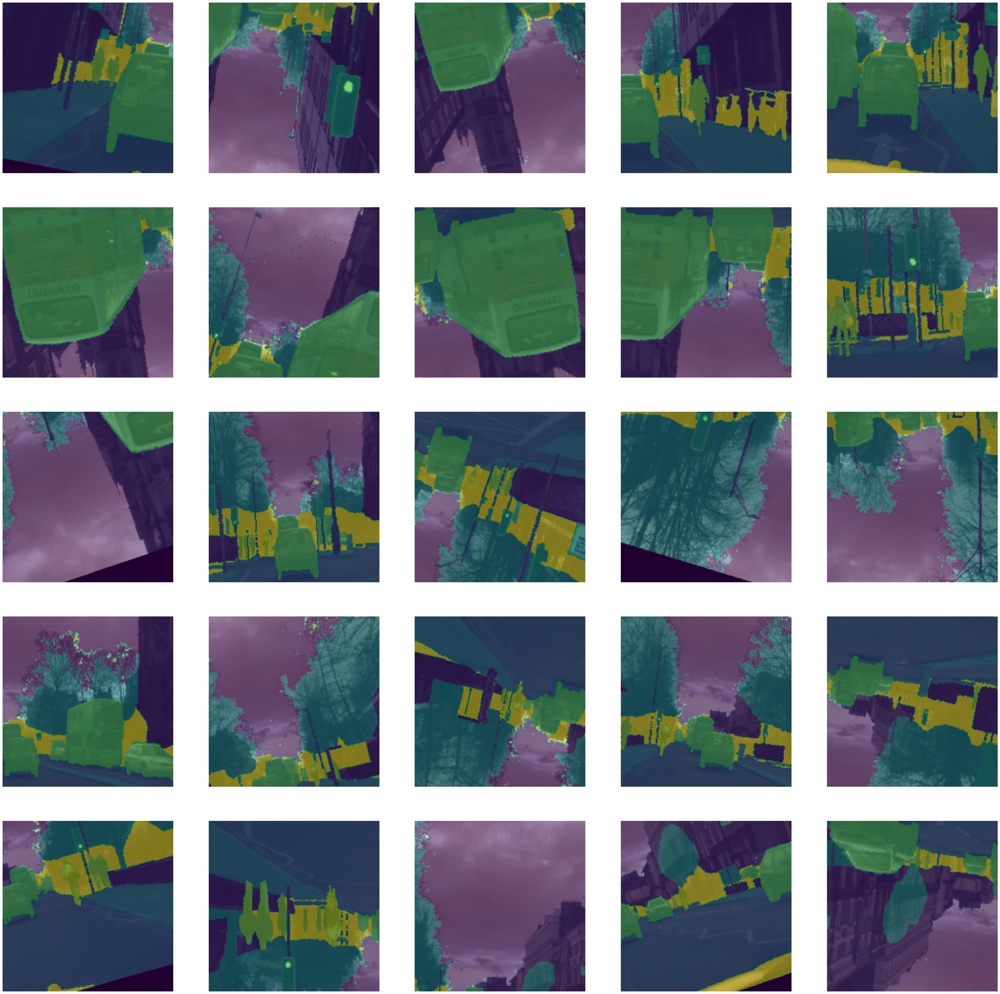

In [139]:
fig, axes = plt.subplots(5 , 5, figsize=(50 , 50))
axes = axes.flatten()
for i, ax in enumerate(axes):
    img, mask = trn_ds[i]
    img = img.permute(1,2,0).numpy()*0.224+0.456
    mask = mask.numpy()
    ax.imshow(img)
    ax.imshow(mask , alpha = 0.5)
    ax.axis("off")

In [140]:
np.unique(mask)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [143]:
trn_loader = DataLoader(trn_ds , batch_size = 8, shuffle=True)
val_loader = DataLoader(val_ds , batch_size= 8 , shuffle=True )


In [144]:
x, y  = next(iter(trn_loader))

In [145]:
y.shape , x.shape

(torch.Size([8, 224, 224]), torch.Size([8, 3, 224, 224]))

In [146]:

#######define neural networks 
def conv(in_channels , out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels ,kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True)
    )

In [147]:
def up_conv(in_channels, out_channels):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2 , stride=2),
        nn.ReLU(inplace=True)
    )

In [148]:
from torchvision.models import vgg16_bn

In [149]:
class UNet(nn.Module):
    def __init__(self, out_channels =12):#out_channels ==> number of segmented classes
        super().__init__()
        self.encoder = vgg16_bn(weights=torchvision.models.VGG16_BN_Weights.DEFAULT).features
        self.blocks = [0, 6, 13, 20, 27, 34]
        self.num_blocks = 5
        for block in range(self.num_blocks):
            setattr(self, f"block{block+1}", nn.Sequential(*self.encoder[self.blocks[block]:self.blocks[block+1]]))
        self.bottleneck = nn.Sequential(*self.encoder[34:])
        self.conv_bottlenk = conv(512, 1024)
        self.up_conv6 = up_conv(1024, 512)
        self.conv6 = conv(512 + 512 , 512)
        self.up_conv7 = up_conv(512, 256)
        self.conv7 = conv(256 + 512, 256)
        self.up_conv8 = up_conv(256, 128)
        self.conv8 = conv(128+ 256 , 128)
        self.up_conv9 = up_conv(128 , 64)
        self.conv9 = conv(64+128, 64)
        self.up_conv10 = up_conv(64, 32)
        self.conv10 = conv(32+ 64 , 32)
        self.conv11 = nn.Conv2d(32, out_channels , kernel_size= 1 )
    
    def forward(self, x):
        block1 = self.block1(x)
        block2 =self.block2(block1)
        block3 = self.block3(block2)
        block4 = self.block4(block3)
        block5 = self.block5(block4)

        bottleneck = self.bottleneck(block5)
        bottleneck = nn.Dropout(0.2)(bottleneck)
        x = self.conv_bottlenk(bottleneck)

        x = self.up_conv6(x)
        x = torch.cat([x, block5],dim = 1)
        x = self.conv6(x)
        x = nn.Dropout(0.2)(x)

        x = self.up_conv7(x)
        x = torch.cat([x, block4], dim=1)
        x = self.conv7(x)
        x = nn.Dropout(0.2)(x)
        x = self.up_conv8(x)
        x = torch.cat([x, block3], dim = 1)
        x = self.conv8(x)
        x = nn.Dropout(0.2)(x)
        x = self.up_conv9(x)
        x = torch.cat([x, block2], dim = 1)
        x = self.conv9(x)
        x = nn.Dropout(0.2)(x)
        x = self.up_conv10(x)
        x = torch.cat([x, block1], dim = 1)
        x = self.conv10(x)

        x = self.conv11(x)

        return x




In [150]:
ce = nn.CrossEntropyLoss()
def UnetLoss(preds , target):
    ce_loss = ce(preds, target)
    acc = (torch.max(preds, 1)[1]== target).float().mean()
    return ce_loss, acc

In [151]:
def train_batch(model, data, optimizer, criterien):
    model.train()
    ims, ce_masks = data
    pred_masks = model(ims)
    loss, acc = criterien(pred_masks, ce_masks)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    return loss.item(), acc.item()

In [152]:
@torch.no_grad()
def validate_batch(model, data , criterien):
    model.eval()

    ims, masks = data
    pred_masks = model(ims)
    loss, acc = criterien(pred_masks, masks)
    return loss.item(), acc.item()

In [153]:
len(os.listdir("semantic_segmentation_dataset/dataset1/annotations_prepped_test"))

101

In [154]:
model = UNet()
criterien = UnetLoss
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
n_epochs = 25

In [155]:
def train(model, train_loader, test_loader , optimizer , criterien, epochs):
    history = {f"{name}_{metrics}": [] for name in ['train','val'] for metrics in ['loss','acc']}
    model.train()
    try :
        for epoch in tqdm.trange(1 , epochs+1):
            train_epoch_loss , train_epoch_acc = [] , []
            for data_batch in notebook.tqdm(train_loader):

                loss, acc = train_batch(model, data_batch, optimizer , criterien)
                train_epoch_loss.append(loss)
                train_epoch_acc.append(acc)
            history['train_loss'].append(np.array(train_epoch_loss).mean())
            history['train_acc'].append(np.array(train_epoch_acc).mean())
            val_epoch_loss , val_epoch_acc = [] , []
            for data_batch in notebook.tqdm(test_loader):

                loss, acc = validate_batch(model, data_batch, criterien)
                val_epoch_loss.append(loss)
                val_epoch_acc.append(acc)
            history['val_loss'].append(np.array(val_epoch_loss).mean())
            history['val_acc'].append(np.array(val_epoch_acc).mean())
            
            text_to_print = f"Epoch {str(epoch+1).zfill(2)}/{epochs} train loss = {history['train_loss'][-1]:0.4f} train acc = {history['train_acc'][-1]:0.3f} "\
                            f"val loss = {history['val_loss'][-1]:0.4f} val acc = {history['val_acc'][-1]:0.3f}"
            print(text_to_print )
    except KeyboardInterrupt:
        print("you stopped model!")

    return history

In [156]:
try :
    history = train(model, trn_loader, val_loader, optimizer , criterien, n_epochs)
except KeyboardInterrupt:
    pass

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  4%|▍         | 1/25 [09:47<3:54:55, 587.31s/it]

Epoch 02/25 train loss = 1.6578 train acc = 0.592 val loss = 1.4382 val acc = 0.644


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  8%|▊         | 2/25 [19:29<3:43:52, 584.03s/it]

Epoch 03/25 train loss = 1.1914 train acc = 0.698 val loss = 1.1921 val acc = 0.645


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 12%|█▏        | 3/25 [29:14<3:34:24, 584.73s/it]

Epoch 04/25 train loss = 1.0535 train acc = 0.719 val loss = 0.9750 val acc = 0.735


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 16%|█▌        | 4/25 [39:04<3:25:23, 586.81s/it]

Epoch 05/25 train loss = 0.9567 train acc = 0.736 val loss = 0.9537 val acc = 0.736


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 20%|██        | 5/25 [48:48<3:15:16, 585.81s/it]

Epoch 06/25 train loss = 0.9000 train acc = 0.745 val loss = 0.7973 val acc = 0.760


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 24%|██▍       | 6/25 [58:40<3:06:06, 587.71s/it]

Epoch 07/25 train loss = 0.8770 train acc = 0.750 val loss = 1.0126 val acc = 0.723


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 28%|██▊       | 7/25 [1:08:33<2:56:54, 589.68s/it]

Epoch 08/25 train loss = 0.8336 train acc = 0.762 val loss = 1.2831 val acc = 0.623


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 32%|███▏      | 8/25 [1:18:23<2:47:05, 589.72s/it]

Epoch 09/25 train loss = 0.8369 train acc = 0.755 val loss = 0.6920 val acc = 0.822


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 36%|███▌      | 9/25 [1:28:11<2:37:07, 589.23s/it]

Epoch 10/25 train loss = 0.7685 train acc = 0.776 val loss = 0.7130 val acc = 0.813


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 40%|████      | 10/25 [1:38:15<2:28:26, 593.75s/it]

Epoch 11/25 train loss = 0.7475 train acc = 0.782 val loss = 0.8167 val acc = 0.797


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 44%|████▍     | 11/25 [1:48:18<2:19:09, 596.41s/it]

Epoch 12/25 train loss = 0.7495 train acc = 0.780 val loss = 0.6900 val acc = 0.804


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 48%|████▊     | 12/25 [1:58:18<2:09:30, 597.73s/it]

Epoch 13/25 train loss = 0.7305 train acc = 0.786 val loss = 0.5755 val acc = 0.839


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 52%|█████▏    | 13/25 [2:08:46<2:01:22, 606.86s/it]

Epoch 14/25 train loss = 0.7481 train acc = 0.783 val loss = 0.7977 val acc = 0.760


  0%|          | 0/46 [00:00<?, ?it/s]

 52%|█████▏    | 13/25 [2:14:56<2:04:33, 622.83s/it]

you stopped model!


In [ ]:
history

In [ ]:
import pickle
with open("history.pkl", "wb") as f:
    pickle.dump(history , f )
torch.save(model.state_dict(), "model.pth")

In [ ]:
res = pd.DataFrame(history)

: 

history


In [ ]:
res.head()

,train_loss,train_acc,val_loss,val_acc
0,0.622993,0.835807,0.768084,0.772923
1,0.548172,0.850267,0.543176,0.855047
2,0.486991,0.864545,0.480028,0.871323
3,0.461812,0.871345,0.447498,0.874888
4,0.419263,0.882525,0.488255,0.850742


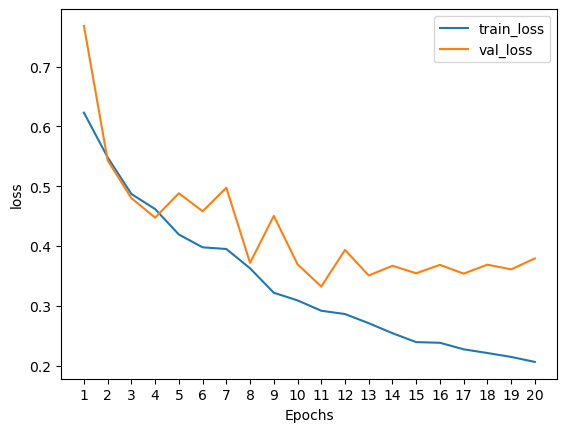

In [ ]:
res[['train_loss', "val_loss"]].plot(kind = "line")
plt.xticks([*range(0, len(res))], [*map(str,range(1 ,len(res)+1))])
plt.xlabel("Epochs")
plt.ylabel("loss")
plt.show()

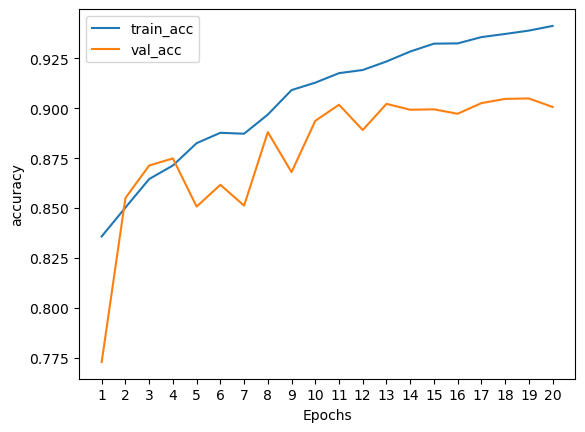

In [ ]:
res[['train_acc', "val_acc"]].plot(kind="line")
plt.xticks([*range(0, len(res))], [*map(str,range(1 ,len(res)+1))])
plt.xlabel("Epochs")
plt.ylabel("accuracy")
plt.show()

In [ ]:
torch.save(model, "unetmodel.pt")